#Importing packages

In [1]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

#Loading the yolo model using opencv 

In [2]:
net = cv2.dnn.readNet('yolov3.weights','yolov3.cfg')

#Yolo model class labels

In [3]:
classes = []
with open('coco.names','r') as f:
  classes = f.read().splitlines()
print(classes)

['person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'diningtable', 'toilet', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


#Loading the test image

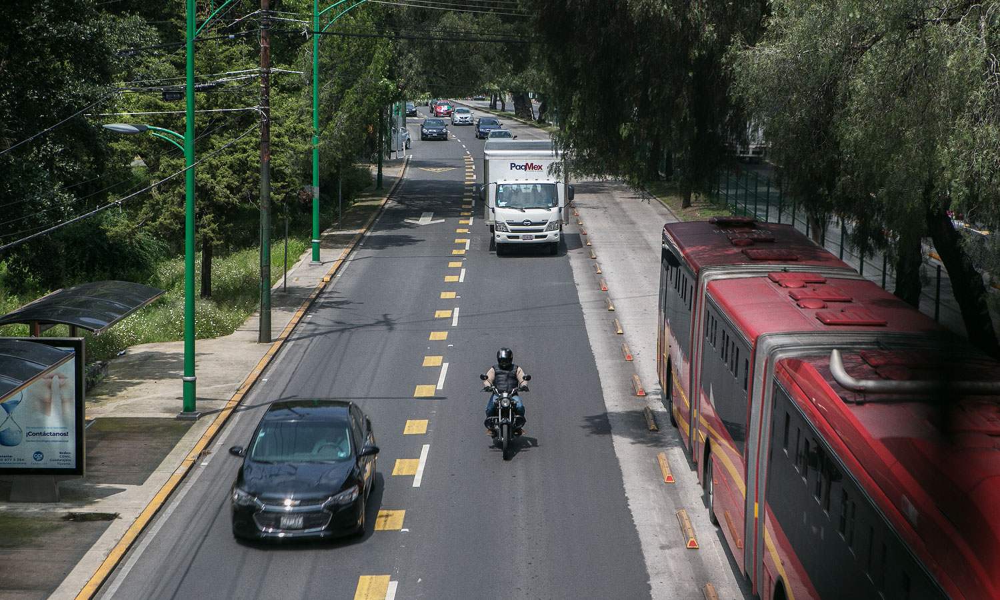

900 1500


In [4]:
img = cv2.imread('/content/test1.jpg')
height,width, _ = img.shape
cv2_imshow(img)
print(height,width)
cv2.waitKey(0)
cv2.destroyAllWindows()

#Object detection on loaded image

In [8]:
boxes=[]
confidences=[]
classes_ids=[]

def detect(img):
  height,width, _ = img.shape
  blob = cv2.dnn.blobFromImage(img, 1/255, (416,416), (0,0,0), swapRB=True, crop=False)
  net.setInput(blob)
  output_layers_names = net.getUnconnectedOutLayersNames()
  layerOutputs = net.forward(output_layers_names)
  
  for output in layerOutputs:
    for detection in output:
      scores= detection[5:]
      class_id = np.argmax(scores)
      confidence = scores[class_id]
      if confidence > 0.75:
        center_x= int(detection[0]*width)
        center_y= int(detection[1]*height)
        w=int(detection[2]*width)
        h=int(detection[3]*height)
        x=int(center_x - w/2)
        y=int(center_y - h/2)
        boxes.append([x,y,w,h])
        confidences.append((float(confidence)))
        classes_ids.append(class_id)

  print(len(boxes))
  

#Visualizing using bounding boxes with confidence percentage and labels

In [9]:
def visualize(img):
  index=cv2.dnn.NMSBoxes(boxes,confidences,0.5,0.4)
  #print(index.flatten())

  font = cv2.FONT_HERSHEY_PLAIN
  colors= np.random.uniform(0,255,size=(len(boxes),3))

  for i in index.flatten():
    x,y,w,h=boxes[i]
    label = str(classes[classes_ids[i]])
    confidence=str(round(confidences[i],2))
    color = colors[i]
    cv2.rectangle(img,(x,y),(x+w,y+h),color,2)
    cv2.putText(img,label + " " +confidence,(x,y+2),font,2,(255,255,255),2)
  cv2_imshow(img)

#Testing on images

5


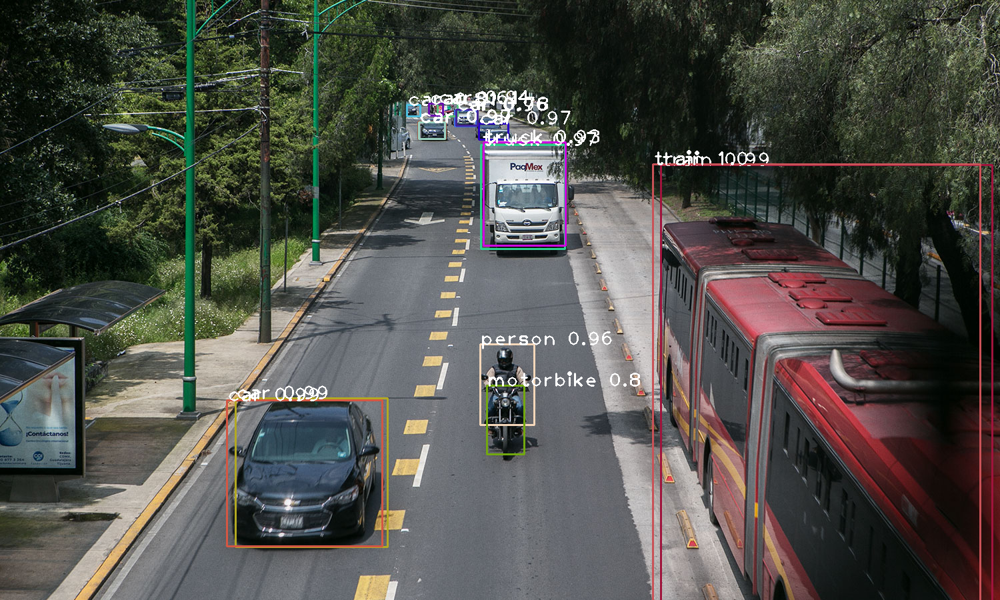

In [10]:
#img=cv2.imread('test1.jpg')
detect(img)
visualize(img)
boxes=[]
confidences=[]
classes_ids=[]

49


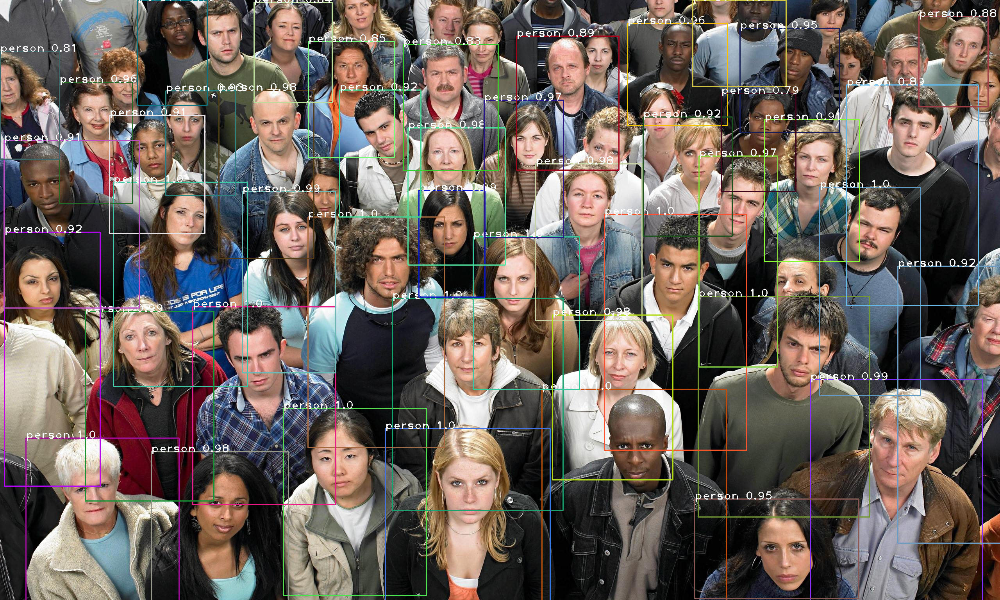

In [11]:
img1=cv2.imread('/content/test.jpg')
detect(img1)
visualize(img1)
boxes=[]
confidences=[]
classes_ids=[]

1


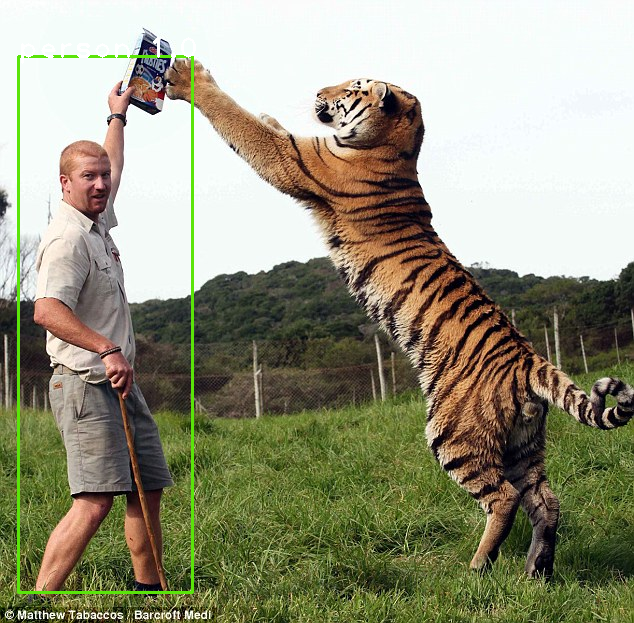

In [24]:
img2=cv2.imread('/content/test_c_3.jpg')
detect(img2)
visualize(img2)
boxes=[]
confidences=[]
classes_ids=[]

#Custom object model Detection

In [17]:
def custom_detection(img):
    net1 = cv2.dnn.readNet("yolov3_training_last(1400).weights", "yolov3_testing.cfg")
    # Name custom object
    classes = ["Tiger"]

    layer_names = net.getLayerNames()
    output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
    colors = np.random.uniform(0, 255, size=(len(classes), 3))

    img = cv2.resize(img, None, fx=0.4, fy=0.4)
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

    net1.setInput(blob)
    outs = net1.forward(output_layers)

    # visualizing
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.3:
                # Object detected
                #print(class_id)
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    #print(indexes)
    font = cv2.FONT_HERSHEY_PLAIN
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            color = colors[class_ids[i]]
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
            cv2.putText(img, label, (x, y + 3), font, 2, color, 2)


    cv2_imshow(img)


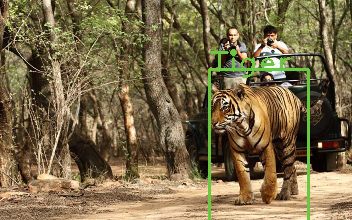

In [21]:
img_c_1=cv2.imread('test_c_1.jpg')
custom_detection(img_c_1)

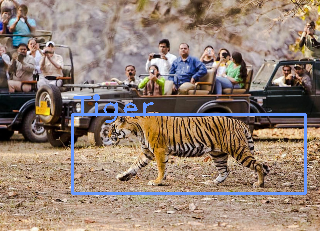

In [22]:
img_c_2=cv2.imread('test_c_2.jpg')
custom_detection(img_c_2)

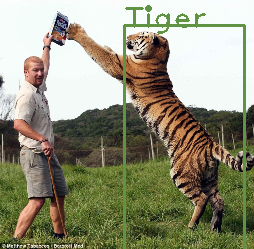

In [23]:
img_c_3=cv2.imread('test_c_3.jpg')
custom_detection(img_c_3)